In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import sys

sys.path.append("/app")

from src.spark_config import get_local_spark

spark = get_local_spark()

:: loading settings :: url = jar:file:/usr/local/lib/python3.10/site-packages/pyspark/jars/ivy-2.5.1.jar!/org/apache/ivy/core/settings/ivysettings.xml


Ivy Default Cache set to: /root/.ivy2/cache
The jars for the packages stored in: /root/.ivy2/jars
io.delta#delta-spark_2.12 added as a dependency
:: resolving dependencies :: org.apache.spark#spark-submit-parent-3314ea99-d40f-419e-93c9-6e1d137abe37;1.0
	confs: [default]
	found io.delta#delta-spark_2.12;3.1.0 in central
	found io.delta#delta-storage;3.1.0 in central
	found org.antlr#antlr4-runtime;4.9.3 in central
downloading https://repo1.maven.org/maven2/io/delta/delta-spark_2.12/3.1.0/delta-spark_2.12-3.1.0.jar ...
	[SUCCESSFUL ] io.delta#delta-spark_2.12;3.1.0!delta-spark_2.12.jar (981ms)
downloading https://repo1.maven.org/maven2/io/delta/delta-storage/3.1.0/delta-storage-3.1.0.jar ...
	[SUCCESSFUL ] io.delta#delta-storage;3.1.0!delta-storage.jar (218ms)
downloading https://repo1.maven.org/maven2/org/antlr/antlr4-runtime/4.9.3/antlr4-runtime-4.9.3.jar ...
	[SUCCESSFUL ] org.antlr#antlr4-runtime;4.9.3!antlr4-runtime.jar (184ms)
:: resolution report :: resolve 2973ms :: artifacts dl 

✅ Spark Session Created
   Spark UI: http://e35e86d1587b:4040



In [4]:
preprocessing_path = "/app/data/02-preprocessed/creditcard_preprocessed"

In [5]:
df_spark = spark.read.format("delta").load(preprocessing_path)

In [6]:
df = df_spark.toPandas()

/usr/local/lib/python3.10/site-packages/pyspark/sql/pandas/types.py:563: FutureWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if not is_datetime64tz_dtype(pser.dtype):
/usr/local/lib/python3.10/site-packages/pyspark/sql/pandas/types.py:379: FutureWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if is_datetime64tz_dtype(s.dtype):
/usr/local/lib/python3.10/site-packages/pyspark/sql/pandas/types.py:563: FutureWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if not is_datetime64tz_dtype(pser.dtype):
/usr/local/lib/python3.10/site-packages/pyspark/sql/pandas/types.py:379: FutureWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` inst

In [8]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V23,V24,V25,V26,V27,V28,Amount,Class,ingestion_timestamp,preprocessing_timestamp
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0,2025-11-27 03:51:37.720,2025-11-27 03:51:59.385450
1,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0,2025-11-27 03:51:37.720,2025-11-27 03:51:59.385450
2,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,...,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0,2025-11-27 03:51:37.720,2025-11-27 03:51:59.385450
3,10.0,1.249999,-1.221637,0.383930,-1.234899,-1.485419,-0.753230,-0.689405,-0.227487,-2.094011,...,0.084668,0.392831,0.161135,-0.354990,0.026416,0.042422,121.50,0,2025-11-27 03:51:37.720,2025-11-27 03:51:59.385450
4,12.0,-0.752417,0.345485,2.057323,-1.468643,-1.158394,-0.077850,-0.608581,0.003603,-0.436167,...,-0.256573,-0.065084,-0.039124,-0.087086,-0.180998,0.129394,15.99,0,2025-11-27 03:51:37.720,2025-11-27 03:51:59.385450


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283726 entries, 0 to 283725
Data columns (total 33 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   Time                     283726 non-null  float64       
 1   V1                       283726 non-null  float64       
 2   V2                       283726 non-null  float64       
 3   V3                       283726 non-null  float64       
 4   V4                       283726 non-null  float64       
 5   V5                       283726 non-null  float64       
 6   V6                       283726 non-null  float64       
 7   V7                       283726 non-null  float64       
 8   V8                       283726 non-null  float64       
 9   V9                       283726 non-null  float64       
 10  V10                      283726 non-null  float64       
 11  V11                      283726 non-null  float64       
 12  V12             

In [10]:
df.describe().T

,count,mean,min,25%,50%,75%,max,std
Time,283726.0,94811.0776,0.0,54204.75,84692.5,139298.0,172792.0,47481.047891
V1,283726.0,0.005917,-56.40751,-0.915951,0.020384,1.316068,2.45493,1.948026
V2,283726.0,-0.004135,-72.715728,-0.600321,0.063949,0.800283,22.057729,1.646703
V3,283726.0,0.001613,-48.325589,-0.889682,0.179963,1.02696,9.382558,1.508682
V4,283726.0,-0.002966,-5.683171,-0.850134,-0.022248,0.739647,16.875344,1.414184
V5,283726.0,0.001828,-113.743307,-0.68983,-0.053468,0.612218,34.801666,1.377008
V6,283726.0,-0.001139,-26.160506,-0.769031,-0.275168,0.396792,73.301626,1.331931
V7,283726.0,0.001801,-43.557242,-0.552509,0.040859,0.570474,120.589494,1.227664
V8,283726.0,-0.000854,-73.216718,-0.208828,0.021898,0.325704,20.007208,1.179054
V9,283726.0,-0.001596,-13.434066,-0.644221,-0.052596,0.595977,15.594995,1.095492


In [11]:
print(df['Class'].value_counts(normalize=True) * 100)

Class
0    99.83329
1     0.16671
Name: proportion, dtype: float64


In [13]:
# check duplicated
duplicated = df.duplicated().sum()
print(duplicated)

0


In [24]:
#check imbalanced data
class_count = df['Class'].value_counts()
class_pct = df['Class'].value_counts(normalize=True) * 100
class_ratio = class_count[0] / class_counts[1]
print(f"Normal Transcations:{class_counts[0]:,} ({class_pct[0]:.2f}%)")
print(f"Fraudulent Transcations:{class_counts[1]:,} ({class_pct[1]:.2f}%)")
print(f"Class Ratio: {class_ratio:.2f} : 1")

Normal Transcations:283,253 (99.83%)
Fraudulent Transcations:473 (0.17%)
Class Ratio: 598.84 : 1


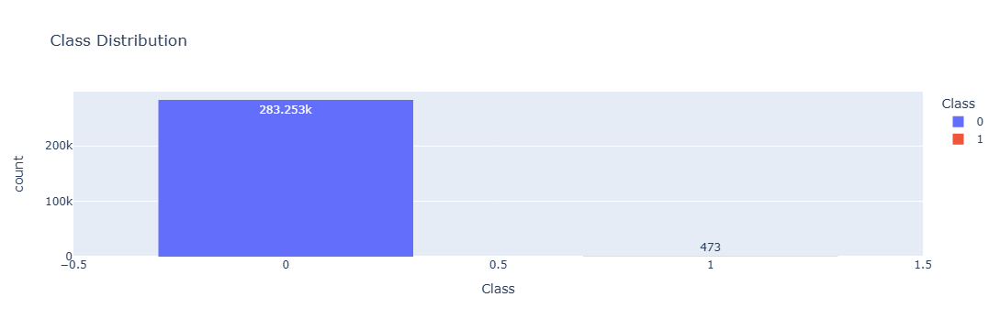

In [25]:
fig = px.histogram(df, x="Class", color="Class", title="Class Distribution", text_auto=True)
fig.update_layout(bargap=0.4)
fig.show()

In [19]:
df_corr = df.corr()['Class'].abs().sort_values(ascending=False)
top_features = df_corr.index[:7]

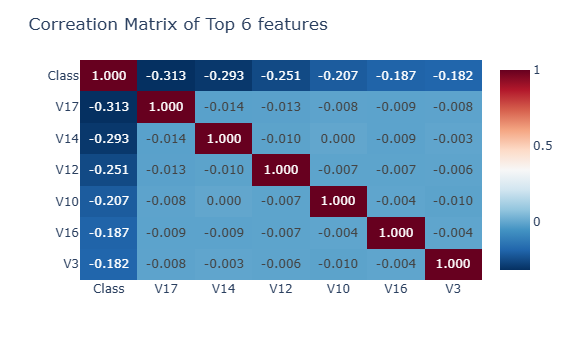

In [23]:
fig = px.imshow(df[top_features].corr(), text_auto=".3f", aspect="auto", color_continuous_scale="RdBu_r")
fig.update_layout(title="Correation Matrix of Top 6 features")
fig.show()

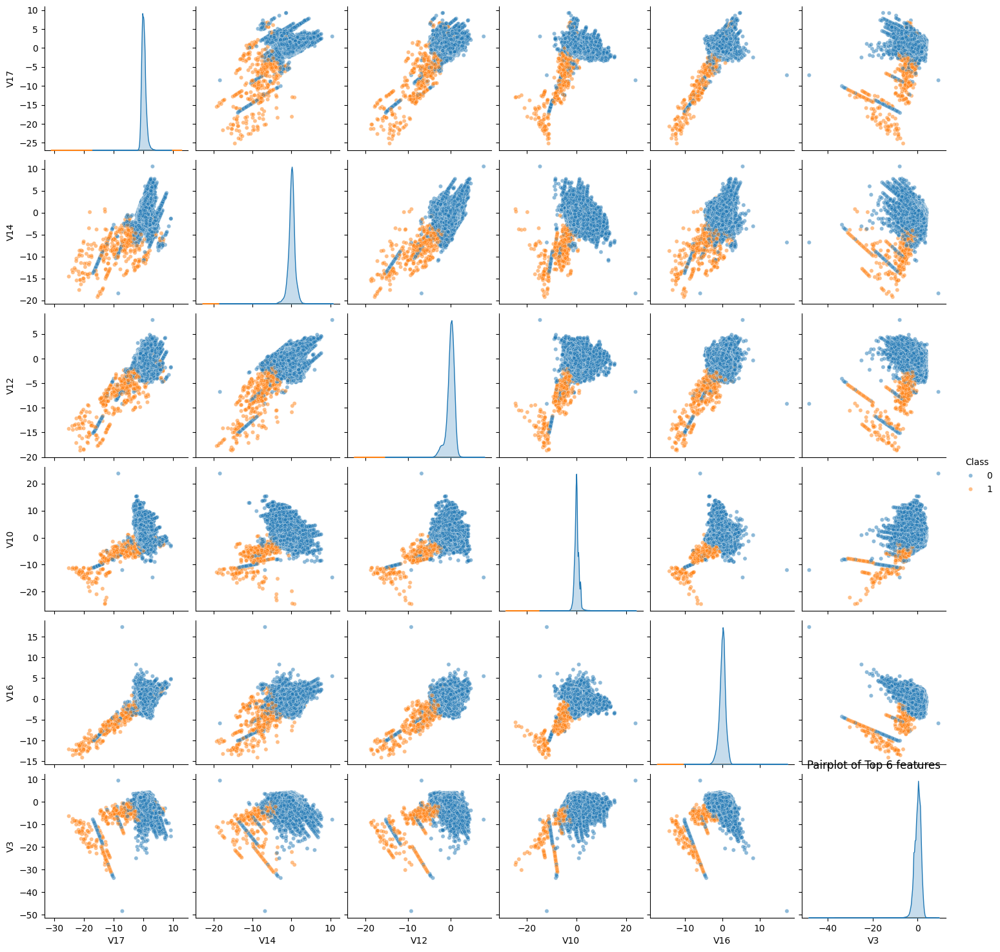

In [24]:
sns.pairplot(df[top_features], diag_kind='kde', hue='Class', plot_kws={'alpha':0.5, 's':20})
plt.title("Pairplot of Top 6 features")
plt.show()

In [25]:
amount_stat = df.groupby('Class')['Amount'].describe().T
print(amount_stat)

Class              0            1
count  283253.000000   473.000000
mean       88.413575   123.871860
std       250.379023   260.211041
min         0.000000     0.000000
25%         5.670000     1.000000
50%        22.000000     9.820000
75%        77.460000   105.890000
max     25691.160000  2125.870000


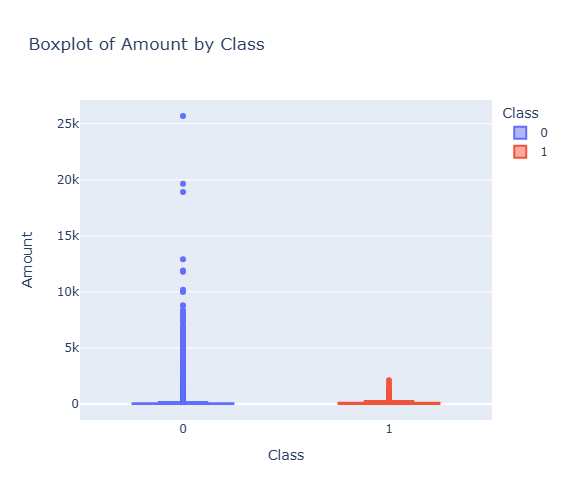

In [26]:
fig = px.box(df, x="Class", y="Amount", color="Class", title="Boxplot of Amount by Class")
fig.update_layout(width=800,height=500)

## Amount Analysis

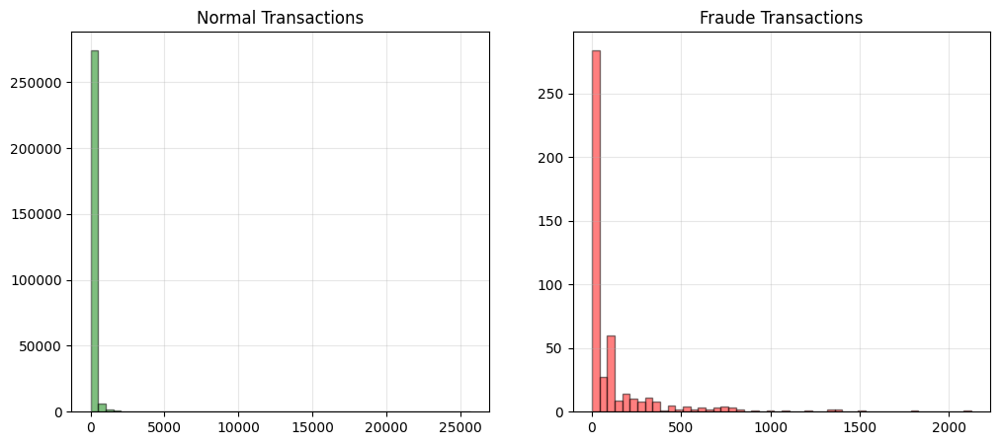

In [27]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
df[df["Class"] == 0]["Amount"].hist(bins=50, ax=ax[0], color='green', alpha=0.5, edgecolor='black')
df[df["Class"] == 1]["Amount"].hist(bins=50, ax=ax[1], color='red', alpha=0.5, edgecolor='black')
ax[0].set_title('Normal Transactions')
ax[0].grid(alpha=0.3)
ax[1].set_title('Fraude Transactions')
ax[1].grid(alpha=0.3)
plt.show()

In [30]:
print(f"Normal Range $0 - ${df[df['Class'] == 0]['Amount'].max():,.2f}")
print(f"Fraudulent Range $0 - ${df[df['Class'] == 1]['Amount'].max():,.2f}")

Normal Range $0 - $25,691.16
Fraudulent Range $0 - $2,125.87


In [33]:
amount_bins = [0,50,100,200,500,1000,df['Amount'].max()]
df['Amount_range'] = pd.cut(df['Amount'], bins = amount_bins)
fraud_by_range = df.groupby('Amount_range')['Class'].agg(['count','sum'])
fraud_by_range = fraud_by_range.rename(columns={'count':'Total', 'sum':'Fraud'})
fraud_by_range['fraud_rate'] = fraud_by_range['Fraud'] / fraud_by_range['Total']
print(fraud_by_range)

                     Total  Fraud  fraud_rate
Amount_range                                 
(0.0, 50.0]         188340    268    0.001423
(50.0, 100.0]        37179     55    0.001479
(100.0, 200.0]       27629     43    0.001556
(200.0, 500.0]       19661     48    0.002441
(500.0, 1000.0]       6174     25    0.004049
(1000.0, 25691.16]    2935      9    0.003066


/tmp/ipykernel_24/3175621332.py:3: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [37]:
output_path = "/app/data/02-preprocessed/creditcard_preprocessed/fraud_by_range.csv"
fraud_by_range.to_csv(output_path, index=True)
print(f"Saved to {output_path}")

Saved to /app/data/02-preprocessed/creditcard_preprocessed/fraud_by_range.csv
